# **TRASH CLASSIFICATION**
*   This notebook will demonstrate how to use CNN (Convolutional Neural Networks) and Keras, built on top of TensorFlow, to classify images of waste. We aim to determine how accurately CNN can classify images of waste.
*  Through this approach, we will train a CNN model using TensorFlow and Keras to recognize and classify images of waste into appropriate categories such as organic waste, plastic, paper, and more.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **Import Libraries**
*   Loads the necessary libraries for data processing, analysis, and model development, such as TensorFlow, Keras, and others.

In [5]:
!pip install keras
!pip install efficientnet
!pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 4.7 MB/s eta 0:00:00


In [18]:
import os
import shutil
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FixedLocator
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras import layers, Model, regularizers
from tensorflow.keras.optimizers import Adam
from efficientnet.tfkeras import EfficientNetB3
import tensorflow as tf

## **Load Data**


*   This stage involves loading the dataset of trash images to be used for training the model.


In [19]:
IMG_HEIGHT, IMG_WIDTH = 224, 224
BATCH_SIZE = 32

output_train_dir = '/content/DATASET/train'
output_val_dir = '/content/DATASET/val'
output_test_dir = '/content/DATASET/test'

In [31]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
)

val_datagen = ImageDataGenerator(rescale=1.0 / 255)

train_generator = train_datagen.flow_from_directory(
    output_train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    shuffle=True,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    output_val_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    shuffle=True,
    class_mode='categorical'
)

test_generator = val_datagen.flow_from_directory(
    output_test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    shuffle=True,
    class_mode='categorical'
)

Found 7722 images belonging to 28 classes.
Found 2000 images belonging to 28 classes.
Found 2012 images belonging to 28 classes.


## **EDA (Exploratory Data Analysis)**


*  Conducts an initial analysis of the dataset to understand its structure, class distribution, and prepare the data for the training process.



In [21]:
print("Train Num      : ", train_generator.samples)
print("Validation Num : ", val_generator.samples)
print("Test Num       : ", test_generator.samples)

Train Num      :  7722
Validation Num :  2000
Test Num       :  2012


In [22]:
class_names = os.listdir('/content/DATASET/train')
print('All category : ',class_names)

All category :  ['box', 'masker', 'tas_plastik', 'alat_makan_plastik', 'tempat_makan_plastik', 'tempat_makan_styrofoam', 'tempat_kosmetik', 'toples', 'sedotan_plastik', 'kertas', 'plastik_bungkus_makanan', 'gelas_plastik', 'sisa_makanan', 'pakaian', 'majalah', 'plastik_tempat_sampah', 'botol_kaca', 'alas_kaki', 'ATK', 'koran', 'gelas_kertas', 'botol_detergen', 'botol_plastik', 'minuman_kaleng', 'rokok', 'kaleng_spray', 'sampah_elektronik', 'tempat_makan_aluminium']


In [ ]:
import os

def countImage(path):
    count  = []
    for x in os.listdir(path):
        item_path = os.path.join(path, x)
        count.append(len(os.listdir(item_path)))
    return count


trainCount = countImage('/content/DATASET/train')
testCount = countImage('/content/DATASET/test')
valCount = countImage('/content/DATASET/val')

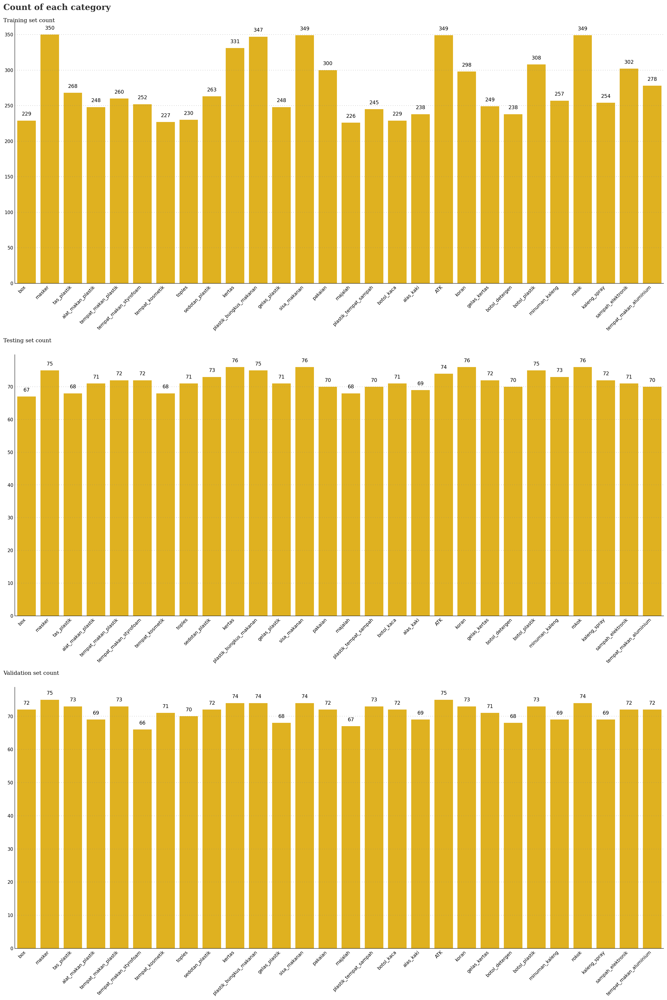

In [23]:
custom_palette = ['#ffc100','#ffb600','#ff9e00','#ff7f00','#ff6100','#ff4d00','#ff3300','#ff3300'] * 4
sns.set_palette(custom_palette)

fig = plt.figure(figsize=(20, 30), dpi=150, constrained_layout=True)

gs = fig.add_gridspec(3, 1)
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[2, 0])

# AX0 - Data Train
ax0.text(-1, max(trainCount) * 1.1, 'Count of each category', fontsize=18,
         fontweight='bold', fontfamily='serif', color="#323232")
ax0.text(-1, max(trainCount) * 1.05, 'Training set count',
         fontfamily='serif', fontsize=12, fontweight='light')
sns.barplot(x=class_names, y=trainCount, ax=ax0)
for i in range(28):
    ax0.annotate(f'{trainCount[i]}',
                 xy=(i, trainCount[i] + max(trainCount) * 0.02),
                 color='black',
                 horizontalalignment='center',
                 fontsize=11,
                 fontweight='light')

# AX1 - Data Test
ax1.text(-1, max(testCount) * 1.1, 'Testing set count',
         fontfamily='serif', fontsize=12, fontweight='light')
sns.barplot(x=class_names, y=testCount, ax=ax1)
for i in range(28):
    ax1.annotate(f'{testCount[i]}',
                 xy=(i, testCount[i] + max(testCount) * 0.02),
                 color='black',
                 horizontalalignment='center',
                 fontsize=11,
                 fontweight='light')

# AX2 - Data Validation
ax2.text(-1, max(valCount) * 1.1, 'Validation set count',
         fontfamily='serif', fontsize=12, fontweight='light')
sns.barplot(x=class_names, y=valCount, ax=ax2)
for i in range(28):
    ax2.annotate(f'{valCount[i]}',
                 xy=(i, valCount[i] + max(valCount) * 0.02),
                 color='black',
                 horizontalalignment='center',
                 fontsize=11,
                 fontweight='light')

# Penyesuaian ticks dan label
for ax in [ax0, ax1, ax2]:
    ax.xaxis.set_major_locator(FixedLocator(range(len(class_names))))
    ax.set_xticklabels(class_names, rotation=45, ha='right', fontsize=10)

# Penyesuaian sumbu dan grid
for s in ["top", "right"]:
    for ax in [ax0, ax1, ax2]:
        ax.spines[s].set_visible(False)

for ax in [ax0, ax1, ax2]:
    ax.tick_params(axis=u'both', which=u'both', length=0)
    ax.grid(color='gray', linestyle=':', axis='y', zorder=0, dashes=(1, 5))

plt.show()

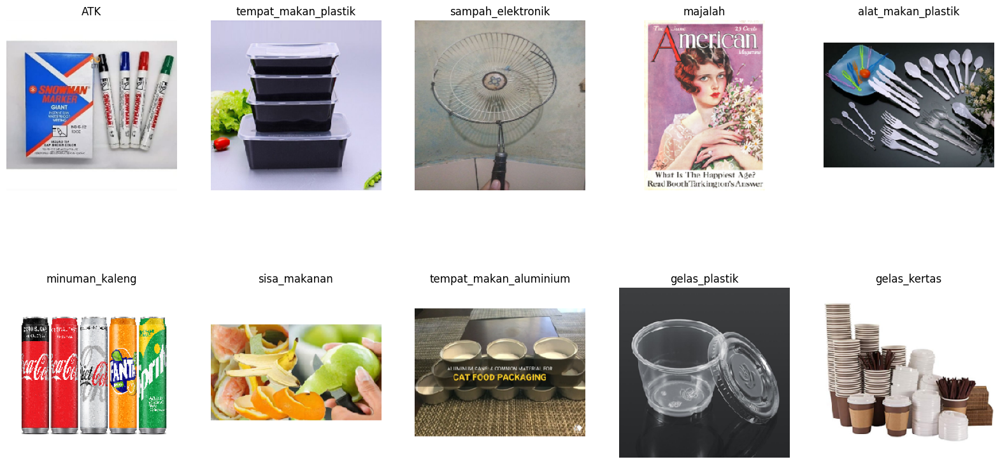

In [49]:
sorted_class_names = [k for k, v in sorted(test_generator.class_indices.items(), key=lambda item: item[1])]

images, labels = next(test_generator)

num_images_to_plot = min(10, len(images))

plt.figure(figsize=(20, 10))
for i in range(num_images_to_plot):
    plt.subplot(2, 5, i + 1)
    plt.imshow(images[i])
    plt.title(sorted_class_names[np.argmax(labels[i])])
    plt.axis("off")

## **Build The Model**

*   Develops a CNN using the EfficientNetB3 architecture to improve the model's ability to classify images accurately.

In [50]:
pre_trained_model = EfficientNetB3(
    include_top=False,
    weights="imagenet",
    input_shape=(224,224,3),
    pooling='avg',
)

44107200/44107200 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


## **Training The Model**


*  Trains the CNN model on the trash dataset with defined hyperparameters to maximize its performance and reduce errors.


In [51]:
reduceLROnPlat = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5, patience=3,
    verbose=1, mode='min',
    min_delta=0.0001, min_lr=1e-6
)

early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

In [52]:
for layer in pre_trained_model.layers[-5:]:
    layer.trainable = True

last_layer = pre_trained_model.get_layer('avg_pool')
last_output = last_layer.output

x = layers.Flatten()(last_output)
x = layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.01))(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.01))(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(28, activation='softmax')(x)

model_B3 = Model(pre_trained_model.input, x)

In [53]:
model_B3.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [54]:
history = model_B3.fit(
          train_generator,
          validation_data = val_generator,
          epochs = 15,
          verbose = 1,
          callbacks=[reduceLROnPlat, early_stopping]
)

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  8/242 ━━━━━━━━━━━━━━━━━━━━ 2:16 585ms/step - accuracy: 0.0275 - loss: 11.2931

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


242/242 ━━━━━━━━━━━━━━━━━━━━ 391s 1s/step - accuracy: 0.0897 - loss: 10.5664 - val_accuracy: 0.6310 - val_loss: 8.0144 - learning_rate: 1.0000e-04
Epoch 2/15
242/242 ━━━━━━━━━━━━━━━━━━━━ 211s 679ms/step - accuracy: 0.4840 - loss: 7.6787 - val_accuracy: 0.8320 - val_loss: 5.5871 - learning_rate: 1.0000e-04
Epoch 3/15
242/242 ━━━━━━━━━━━━━━━━━━━━ 202s 674ms/step - accuracy: 0.7145 - loss: 5.7142 - val_accuracy: 0.8835 - val_loss: 4.4403 - learning_rate: 1.0000e-04
Epoch 4/15
242/242 ━━━━━━━━━━━━━━━━━━━━ 164s 664ms/step - accuracy: 0.7985 - loss: 4.5385 - val_accuracy: 0.8980 - val_loss: 3.6598 - learning_rate: 1.0000e-04
Epoch 5/15
242/242 ━━━━━━━━━━━━━━━━━━━━ 201s 664ms/step - accuracy: 0.8493 - loss: 3.6786 - val_accuracy: 0.9180 - val_loss: 2.9980 - learning_rate: 1.0000e-04
Epoch 6/15
242/242 ━━━━━━━━━━━━━━━━━━━━ 202s 663ms/step - accuracy: 0.8920 - loss: 2.9881 - val_accuracy: 0.9180 - val_loss: 2.5186 - learning_rate: 1.0000e-04
Epoch 7/15
242/242 ━━━━━━━━━━━━━━━━━━━━ 163s 649ms/st

In [55]:
train_loss, train_accuracy = model_B3.evaluate(train_generator, verbose=1)
print(f"\nFinal Training Accuracy: {train_accuracy * 100:.2f}%")

val_loss, val_accuracy = model_B3.evaluate(val_generator, verbose=1)
print(f"\nFinal Validation Accuracy: {val_accuracy * 100:.2f}%")

test_loss, test_accuracy = model_B3.evaluate(test_generator, verbose=1)
print(f"\nFinal Test Accuracy: {test_accuracy * 100:.2f}%")

242/242 ━━━━━━━━━━━━━━━━━━━━ 138s 573ms/step - accuracy: 0.9980 - loss: 0.4283

Final Training Accuracy: 99.82%
63/63 ━━━━━━━━━━━━━━━━━━━━ 11s 180ms/step - accuracy: 0.9384 - loss: 0.6624

Final Validation Accuracy: 93.85%
63/63 ━━━━━━━━━━━━━━━━━━━━ 23s 375ms/step - accuracy: 0.9298 - loss: 0.6965

Final Test Accuracy: 93.19%


In [56]:
test_loss, test_acc = model_B3.evaluate(test_generator)
print("loss:", test_loss)
print("acc:", test_acc)

63/63 ━━━━━━━━━━━━━━━━━━━━ 13s 203ms/step - accuracy: 0.9245 - loss: 0.6995
loss: 0.6752054691314697
acc: 0.9319085478782654


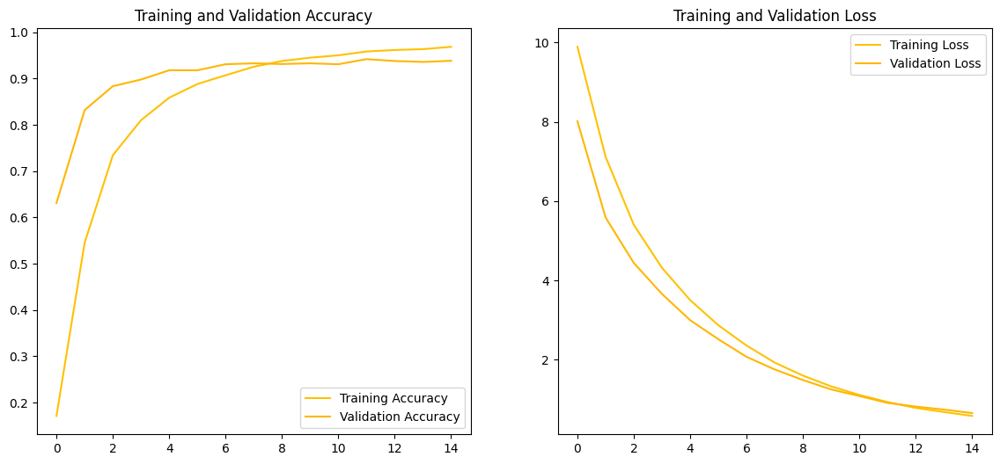

In [57]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs_range = range(len(acc))

    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

plot_training_history(history)

# **Evaluate**



*   Assesses the model’s performance through evaluation metrics like accuracy, precision, and recall, ensuring that the model effectively identifies and classifies trash types.


Found 2012 images belonging to 28 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━

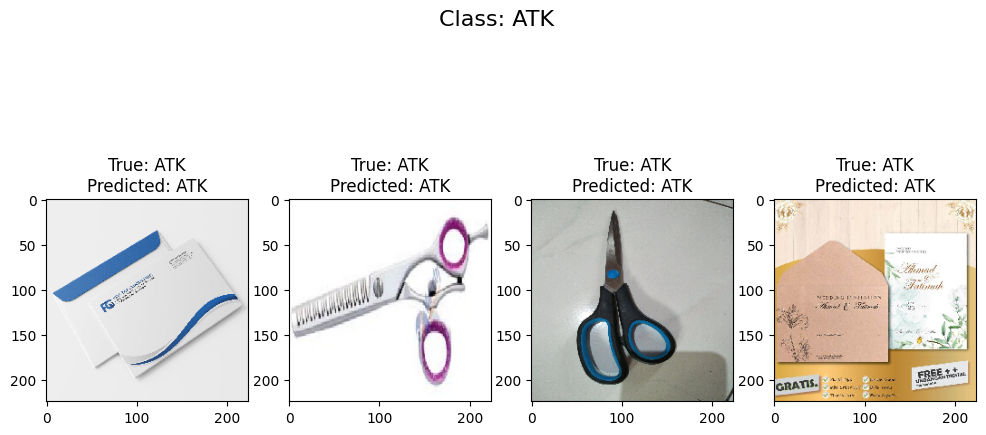

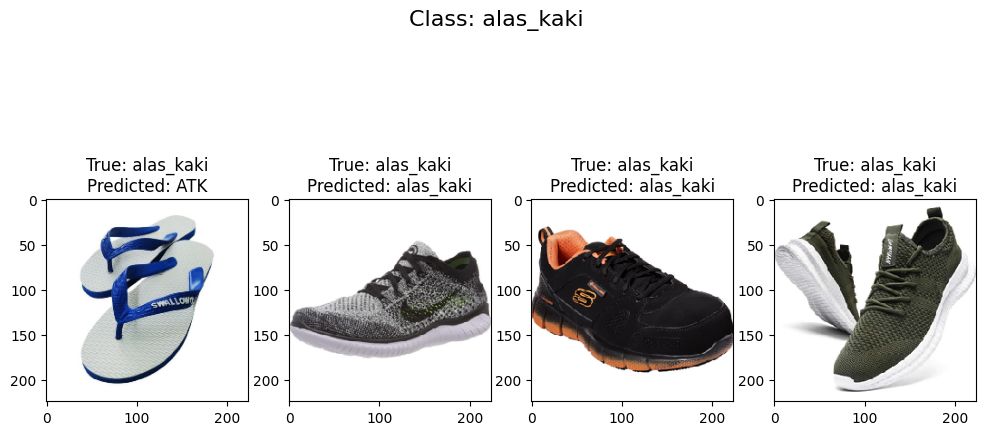

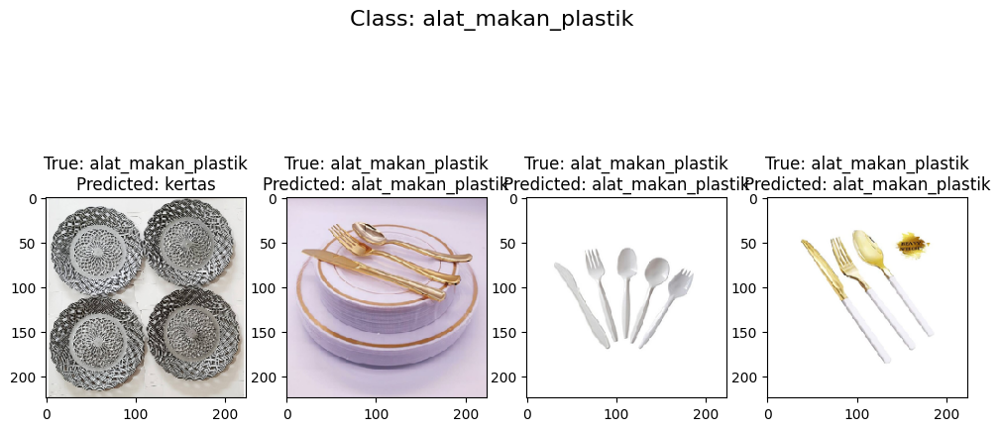

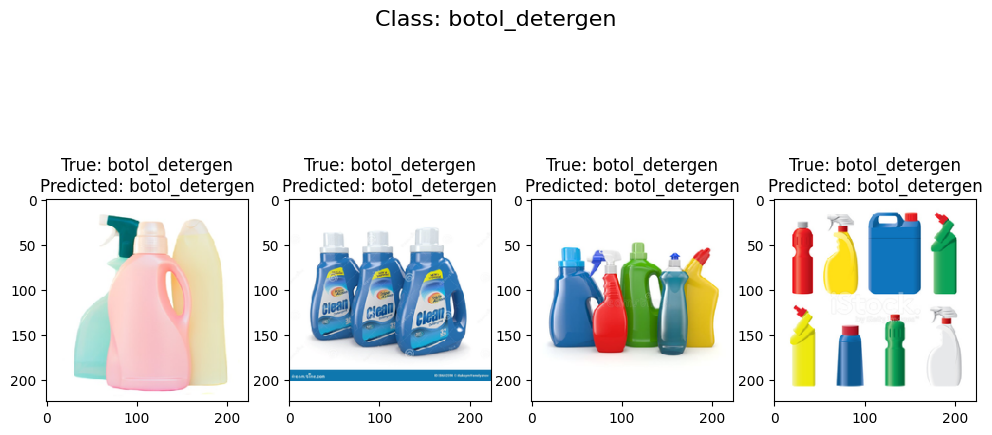

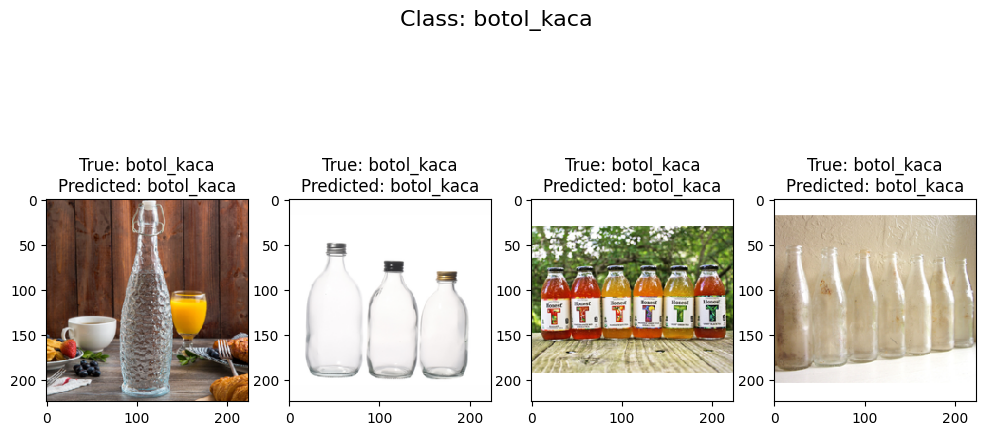

...

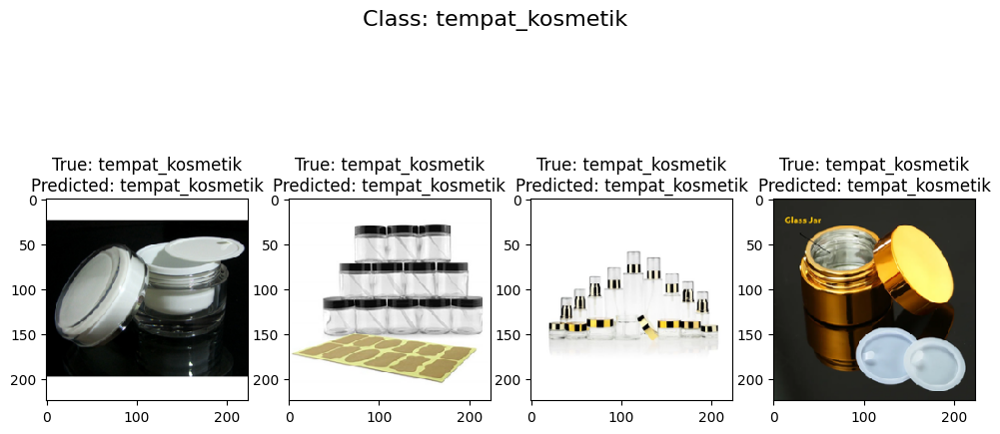

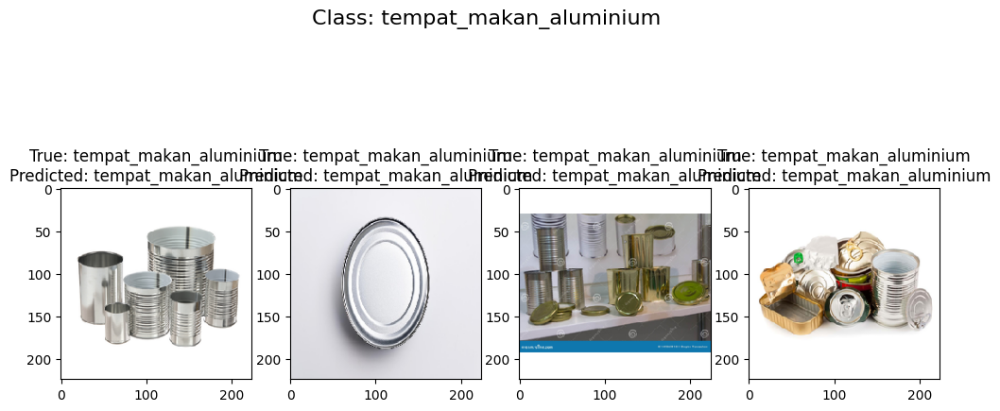

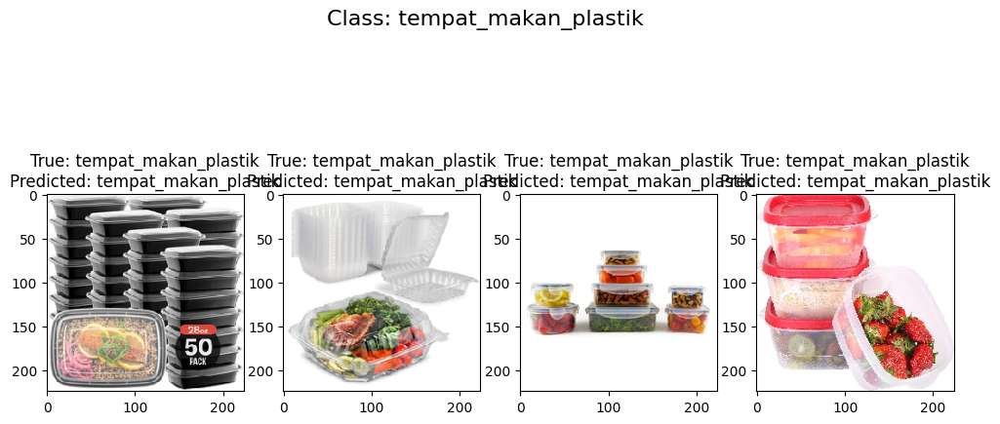

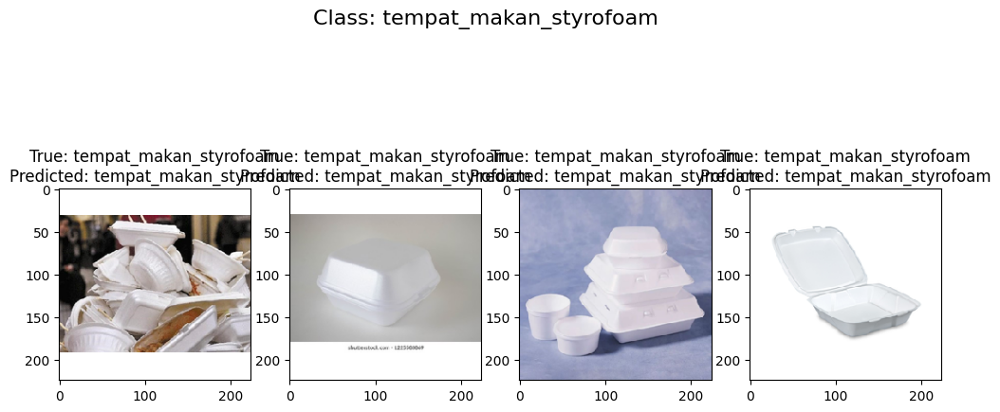

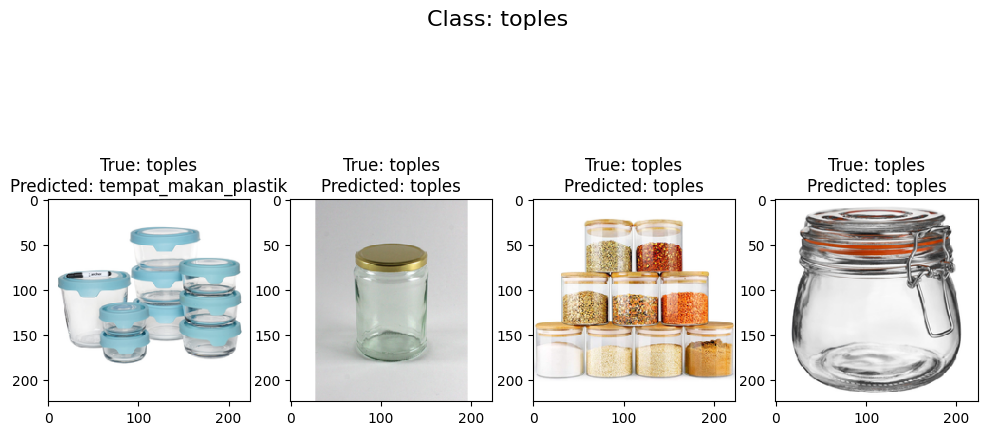

In [58]:
import numpy as np
import os
# List kelas
class_names = sorted(os.listdir(output_test_dir))

def predict_and_display_samples(model_B3, output_test_dir, class_names, num_samples=4):
    # Ambil generator data test
    test_datagen = ImageDataGenerator(rescale=1./255)
    test_generator = test_datagen.flow_from_directory(
        output_test_dir,
        target_size=(224,224),
        batch_size=1,
        class_mode='categorical',
        shuffle=False
    )

    # Membuat daftar kosong untuk setiap kelas
    samples_per_class = {class_name: [] for class_name in class_names}

    for i in range(len(test_generator)):
        if len(samples_per_class) == len(class_names) * num_samples:
            break

        # Ambil satu sampel dari generator
        img, true_label = next(test_generator)
        true_label_idx = np.argmax(true_label[0])

        true_class = class_names[true_label_idx]
        samples = samples_per_class[true_class]

        if len(samples) < num_samples:
            # Lakukan prediksi
            pred = model_B3.predict(img)
            pred_label_idx = np.argmax(pred)
            pred_class = class_names[pred_label_idx]

            samples.append((img[0], true_class, pred_class))

    # Tampilkan sampel
    for class_name, samples in samples_per_class.items():
        plt.figure(figsize=(12, 6))
        plt.suptitle(f"Class: {class_name}", fontsize=16)
        for i, (img, true_label, pred_label) in enumerate(samples):
            plt.subplot(1, num_samples, i + 1)
            plt.imshow(img)
            plt.title(f'True: {true_label}\nPredicted: {pred_label}')

        plt.show()

predict_and_display_samples(model_B3, output_test_dir, class_names, num_samples=4)

In [59]:
import numpy as np
import os
import tensorflow as tf

# List kelas
class_names = sorted(os.listdir(output_test_dir))

y_test = []
y_pred = []

for i in range(len(test_generator)) :
    x,y = next(test_generator)
    for j in range(len(y)) :
        y_test.append(class_names[tf.argmax(y[j])])
        y_pred.append(class_names[np.argmax(model_B3.predict(x[j][None,...],verbose=0))])

In [60]:
from sklearn.metrics import confusion_matrix
import matplotlib
import seaborn as sns

#Confusion Matrix
fig, ax = plt.subplots(figsize=(100, 100),dpi=150)
cm = confusion_matrix(y_test, y_pred)

colors = ["#393E46","#393E46"]
colormap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)

ax.text(0,-0.3,'Confusion Matrix ',fontfamily='serif',fontsize=15,fontweight='bold')
ax.text(0,-0.12,'EfficientB3 Model',fontfamily='serif',fontsize=12,fontweight='light')
sns.heatmap(ax=ax, data=cm,
            square=True, cbar_kws={"orientation": "horizontal"}, cbar=False,linewidth=1.5, annot=True,cmap=colormap,
            annot_kws={"fontsize":12},fmt='')

ax.set_xticklabels(class_names)
ax.set_yticklabels(class_names)

ax.set_ylabel("Actual Label",fontsize=10)
ax.set_xlabel("Predicted Label",fontsize=10)

from matplotlib.patches import Rectangle
for i in range(0,28):
    ax.add_patch(Rectangle((i, i), 1, 1, fill=True,color='#00ADB5'))

plt.show()

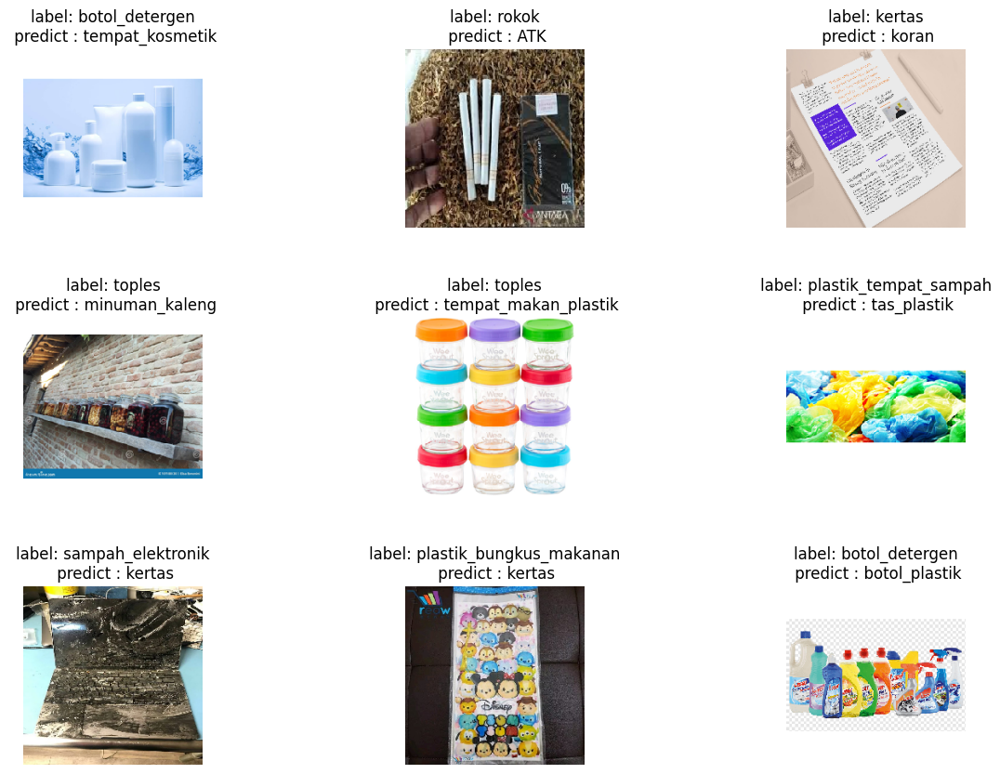

In [62]:
plt.figure(figsize=(15,10))

Truelabel = []
img = []
pred = []
batch_size = test_generator.batch_size

for i in range(len(test_generator)) :
    image,label = next(test_generator)
    for j in range(batch_size):
        if (len(Truelabel) == 9) :
            break

        Aktual = class_names[np.argmax(label[j])]
        y_pred = np.argmax(model_B3.predict(image[j][None,...],verbose=0))
        if (Aktual != class_names[y_pred]):
            Truelabel.append(Aktual)
            img.append(image[j])
            pred.append(y_pred)

for k in range(9) :
    plt.subplot(3,3,k+1)
    plt.subplots_adjust(hspace=0.5)
    plt.imshow(tf.squeeze(img[k]))
    plt.axis('off')
    plt.title(f'label: {Truelabel[k]}\n predict : {class_names[pred[k]]}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step


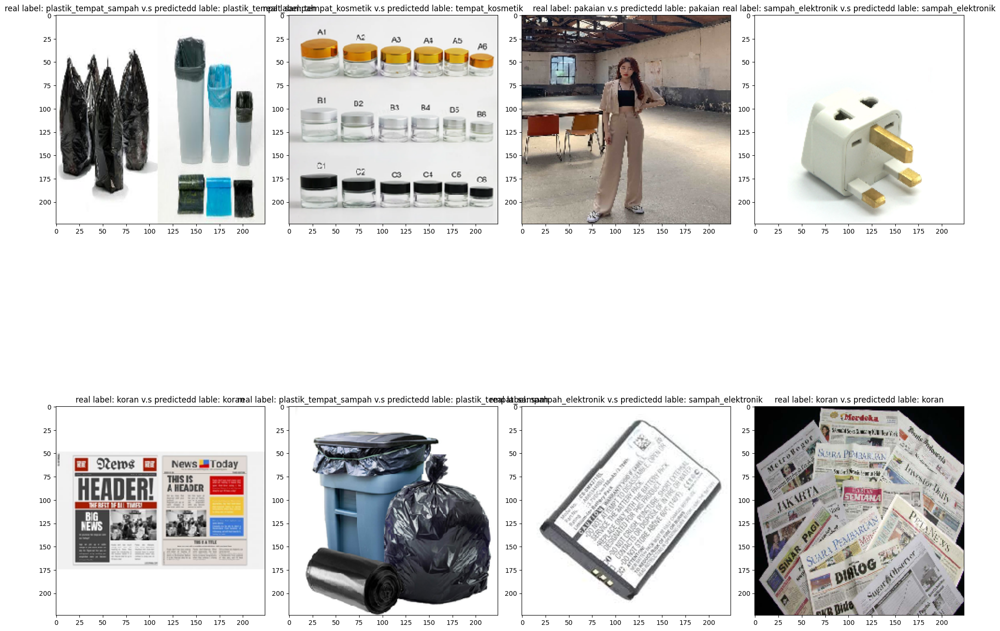

In [63]:
images, labels = next(val_generator) # Use next(val_generator) instead of val_generator.next()
preds = model_B3.predict(images)
fig,axes=plt.subplots(nrows=2,ncols=4,figsize=(20,20))
dic={i:ax for i,ax in enumerate(axes.flat)}
# Assuming class_names is the variable containing your class names
for i in range(0,8):
    label = np.argmax(labels[i])
    pred = np.argmax(preds[i])
    image = images[i]
    # Replace 'classes' with 'class_names'
    dic[i].set_title("real label: " + str(class_names[label]) + " v.s " + "predictedd lable: " + str(class_names[pred]))
    dic[i].imshow(image)
plt.tight_layout()
plt.show()

In [72]:
model  = model_B3.save('model_EfficientNetB3.h5')

Hasil Prediksi: kertas
Confidence: 98.25%


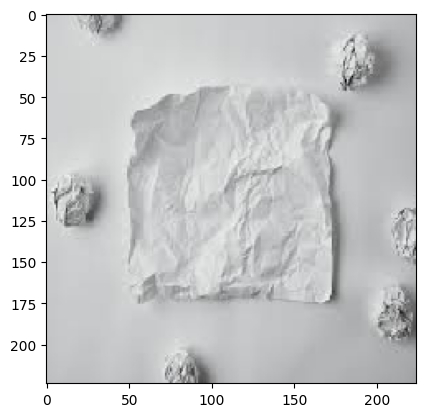

In [71]:
img_path = r"/content/kertas.jpeg"
CLASS_NAMES = ['ATK', 'alas_kaki', 'alat_makan_plastik', 'botol_detergen', 'botol_kaca', 'botol_plastik', 'box', 'gelas_kertas', 'gelas_plastik', 'kaleng_spray', 'kertas', 'koran', 'majalah', 'masker', 'minuman_kaleng', 'pakaian', 'plastik_bungkus_makanan', 'plastik_tempat_sampah', 'rokok', 'sampah_elektronik', 'sedotan_plastik', 'sisa_makanan', 'tas_plastik', 'tempat_kosmetik', 'tempat_makan_aluminium', 'tempat_makan_plastik', 'tempat_makan_styrofoam', 'toples']

img = image.load_img(img_path, target_size=(224, 224))
imgplot = plt.imshow(img)
x = image.img_to_array(img)
x = x/255.0
x = np.expand_dims(x, axis=0)
images = np.vstack([x])

classes = model.predict(images, batch_size=10, verbose=0)

class_id = np.argmax(classes)
class_name = CLASS_NAMES[class_id]
confidence = classes[0][class_id]

# Output the results
print(f'Hasil Prediksi: {class_name}')
print(f'Confidence: {confidence*100:.2f}%')